# In this notebook
I look at the relationship between temperature and census tract.

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from matplotlib import pyplot as plt

import pymc as pm
import arviz as az

%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")

/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_79818/2087585347.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [4]:
# This code loads the census tract shapefile for Durham County
tracts = gpd.read_file('../data/raw/census/tl_2020_37063_tract20/tl_2020_37063_tract20.shp')

# This code loads the median household income for Durham county
income = pd.read_excel('../data/raw/census/acs_median_income.xlsx', header=1)
income['tract'] = income['Geography'].str.split('US').str[1]
# Extract the tracts that begin with 37063 (Durham)
income = income.loc[income['tract'].str.contains(r'^37063\d.')]

# This code loads the population for Durham county
population = pd.read_csv("../data/raw/census/ACSDP5Y2020.DP05-Data.csv", header=1)
population = population[['Geography','Estimate!!SEX AND AGE!!Total population']]
population['tract'] = population['Geography'].str.split('US').str[1]

# Rename 'Estimate!!SEX AND AGE!!Total population' to population
population.rename({'Estimate!!SEX AND AGE!!Total population':'population'}, axis=1, inplace=True)

# Now, let's merge the dataframes together
df = tracts.merge(income, left_on='GEOID20', right_on='tract')
df = df.merge(population, left_on='GEOID20', right_on='tract')

# Only keep the columns we need:
#  aland, geometry, median income, population
df = df[['GEOID20', 'ALAND20', 'geometry', 'Median Household Income', 'population']]

# Rename columns
df.rename({'ALAND20':'area', 'Median Household Income':'income'}, axis=1, inplace=True)

df.head()

,GEOID20,area,geometry,income,population
0,37063000101,3370322,"POLYGON ((-78.89489 36.02991, -78.89343 36.030...",72382,3716
1,37063000102,3998235,"POLYGON ((-78.91655 36.02532, -78.91635 36.025...",51488,3702
2,37063000200,3021171,"POLYGON ((-78.90299 36.00574, -78.90253 36.006...",52375,3309
3,37063000301,1586355,"POLYGON ((-78.91957 36.01043, -78.91949 36.011...",41750,2826
4,37063000302,1722150,"POLYGON ((-78.91246 36.00396, -78.91243 36.004...",92500,3515


In [5]:
# Replace values with '-' with np.nan
df = df.replace('-', np.nan)

/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_79818/4017959237.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace('-', np.nan)


# Now, let's merge the station data with this data

In [10]:
# Read in the station data
stations = pd.read_csv('../data/raw/temperature/weather_underground/durham_stations.csv')
stations = stations[stations['qcStatus'] == 1]

# Read in the weather underground data
wu_data = pd.read_csv("../data/raw/temperature/weather_underground/july23_wu_durham.csv")

# Merge on stationId
wu_data = wu_data.merge(stations, on='stationId')

# Remove any nan for eve_avg
wu_data = wu_data[~wu_data['eve_avg'].isna()]

print(len(wu_data))
wu_data.head()

125


,stationId,morn_avg,aft_avg,eve_avg,latitude,longitude,qcStatus
0,KNCDURHA272,22.129301,30.464151,27.943548,35.939,-78.970,1
1,KNCDURHA486,21.491667,31.377957,27.698656,35.940,-78.967,1
2,KNCDURHA393,21.553226,31.622849,28.851075,35.943,-78.973,1
3,KNCDURHA409,22.403297,33.564770,29.155220,35.946,-78.970,1
4,KNCDURHA407,22.242204,30.466935,28.387332,35.934,-78.963,1


In [263]:

geoid = []
income = []
population = []
num_stations = []
eve_avg = []
area = []
geometry = []

for i, row in df.iterrows():
    count = 0
    sum_temp = 0

    for j, s in wu_data.iterrows():
        # Check if station is in polygon
        p = Point(s['longitude'], s['latitude'])
        if row.geometry.contains(p):
            count += 1
            sum_temp += s['eve_avg']


    geoid.append(row['GEOID20'])
    income.append(row['income'])
    population.append(row['population'])
    area.append(row['area'])
    geometry.append(row['geometry'])
    num_stations.append(count)
    if count == 0:
        eve_avg.append(np.nan)
    else:
        eve_avg.append(sum_temp/count)

assert len(geoid) == len(income) == len(population) == len(num_stations) == len(eve_avg) == len(area) == len(geometry)

In [264]:
count_data = pd.DataFrame({
    "geoid": geoid,
    "income": income,
    "area": area,
    "population": population,
    "num_stations": num_stations,
    "eve_avg": eve_avg,
    "geometry": geometry
})

# Create a geopandas dataframe
count_data = gpd.GeoDataFrame(count_data, geometry='geometry')

count_data.head()

,geoid,income,area,population,num_stations,eve_avg,geometry
0,37063000101,72382.0,3370322,3716,1,28.700269,"POLYGON ((-78.89489 36.02991, -78.89343 36.030..."
1,37063000102,51488.0,3998235,3702,2,29.108803,"POLYGON ((-78.91655 36.02532, -78.91635 36.025..."
2,37063000200,52375.0,3021171,3309,0,NaN,"POLYGON ((-78.90299 36.00574, -78.90253 36.006..."
3,37063000301,41750.0,1586355,2826,0,NaN,"POLYGON ((-78.91957 36.01043, -78.91949 36.011..."
4,37063000302,92500.0,1722150,3515,3,29.483394,"POLYGON ((-78.91246 36.00396, -78.91243 36.004..."


Now, let's clean up the data just a bit -- we are going to get the adjacency matrix for this dataset, and use that adjacency matrix to populate income where it is missing. We are also going to remove the census tract that has zero population.

Are there any weird values?

In [265]:
# Are there missing values?
print(sum(count_data['income'].isna()))

# Is there a place with no population?
print(sum(count_data['population'] == 0))

3
1


In [266]:
# Remove the row with no population
count_data = count_data[count_data['population'] != 0]
print(len(count_data))

67


In [267]:
no_income_mask = count_data[count_data['income'].isna()]

In [29]:
count_data.head()

,geoid,income,area,population,num_stations,eve_avg,geometry
0,37063000101,72382.0,3370322,3716,1,28.700269,"POLYGON ((-78.89489 36.02991, -78.89343 36.030..."
1,37063000102,51488.0,3998235,3702,2,29.108803,"POLYGON ((-78.91655 36.02532, -78.91635 36.025..."
2,37063000200,52375.0,3021171,3309,0,NaN,"POLYGON ((-78.90299 36.00574, -78.90253 36.006..."
3,37063000301,41750.0,1586355,2826,0,NaN,"POLYGON ((-78.91957 36.01043, -78.91949 36.011..."
4,37063000302,92500.0,1722150,3515,3,29.483394,"POLYGON ((-78.91246 36.00396, -78.91243 36.004..."


In [30]:

no_income_mask

,geoid,income,area,population,num_stations,eve_avg,geometry
18,37063001501,NaN,2738792,3498,0,NaN,"POLYGON ((-78.95315 35.99813, -78.95288 35.998..."
19,37063001503,NaN,449529,1923,0,NaN,"POLYGON ((-78.91982 36.00594, -78.91974 36.007..."


In [268]:
import libpysal
from libpysal.weights import Rook

w = Rook.from_dataframe(count_data)

for no_income in no_income_mask.index:
    neighbors = w.neighbors[no_income]
    print(neighbors)
    print(count_data['income'][neighbors])
    no_income_neighbors = count_data['income'].values[neighbors].mean()

    count_data.loc[no_income, 'income'] = no_income_neighbors

[8, 20, 21, 7]
8     50972.0
20    29652.0
21    32877.0
7     30645.0
Name: income, dtype: float64
[65, 3, 4, 6, 7]
65    79917.0
3     41750.0
4     92500.0
6     35926.0
7     30645.0
Name: income, dtype: float64


/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_79818/3940928076.py:4: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Rook.from_dataframe(count_data)


In [269]:
# Extract adjancency matrix from this weights object
adj = w.to_sparse().todense()

In [270]:
temp = count_data['eve_avg'].values

# Create a masked array from this array
temp = np.ma.array(temp, mask=np.isnan(temp))



In [72]:
temp_mean = temp.mean()

# Model 1
This model just looks at temperature like a spatial process.

In [209]:
temp.var()

0.7187075773504328

In [242]:
with pm.Model() as m1:
    sigma = pm.Exponential('sigma', 1)
    eps = pm.Exponential('eps', 1)
    mu = pm.Normal('mu', mu = temp.mean(), sigma = temp.std())
    phi = pm.ICAR('phi', W=adj)

    # Likelihood
    T = pm.Normal('temp', mu + sigma*phi, sigma = eps, observed=temp)

    # Sample
    trace_1 = pm.sample(1000, tune=1000, chains=2, cores=2, target_accept=0.9)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 35 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'phi'}>, <Axes: title={'center': 'phi'}>]],
      dtype=object)

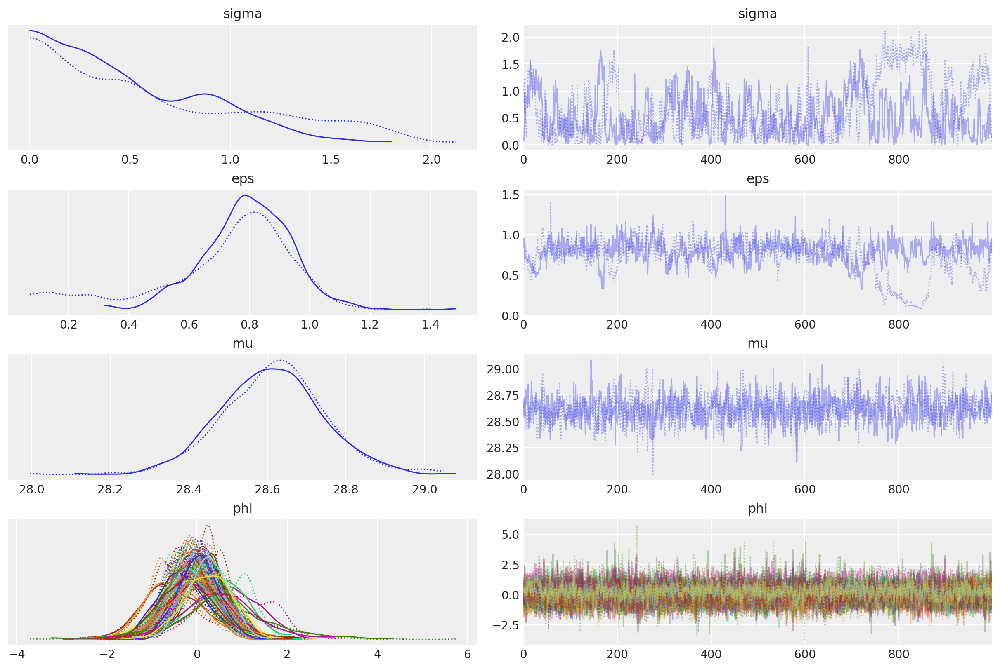

In [243]:
az.plot_trace(trace_1, var_names=['sigma', 'eps', 'mu', 'phi'])

<Axes: >

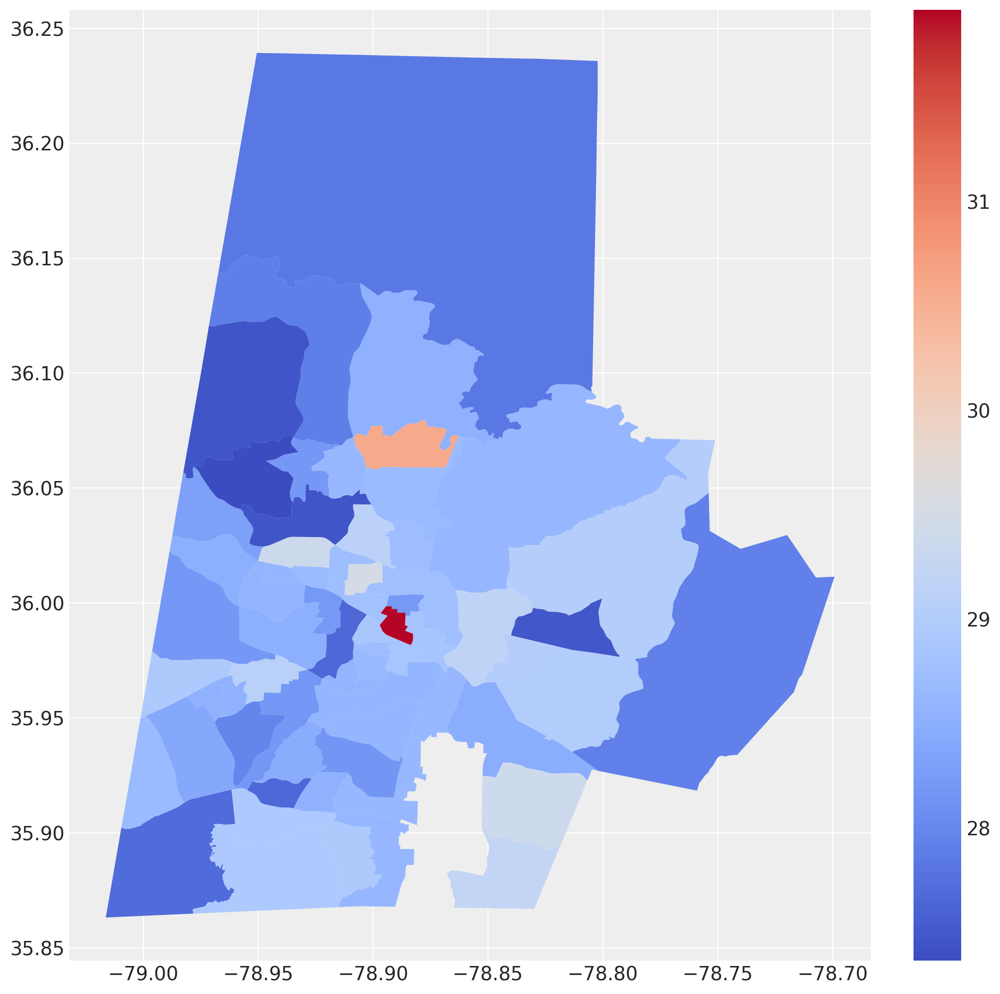

In [271]:
count_data['m1_temp'] = trace_1.posterior['temp'].mean(axis=(0,1)).values
count_data.plot(column='m1_temp', legend=True, figsize=(10,10), cmap='coolwarm')

So, if we do no correcting, we would assume that the temperature is just the mean in the unobserved locations. This is probably a reasonable assumption, in the absence of all data.

# Model 2
In this model, we adjust for the spatial process to predict the intensity of temperature.

In [272]:
counts = count_data['num_stations'].values
population = count_data['population'].values / 1000

In [124]:
with pm.Model() as m2:
    sigma = pm.Exponential('sigma', 1)
    eps = pm.Exponential('eps', 1)
    mu = pm.Normal('mu', mu = temp.mean(), sigma = temp.std())
    phi = pm.ICAR('phi', W=adj)

    theta_0 = pm.Normal('theta_0', mu = 0, sigma = 10)
    theta_1 = pm.Normal('theta_1', mu = 0, sigma = 10)

    # Likelihood
    phi_spat = sigma*phi
    T = pm.Normal('temp', mu + phi_spat, sigma = eps, observed=temp)

    intensity = pm.math.exp(theta_0 + theta_1*phi_spat)
    rates = intensity * population
    lam = pm.Poisson('lam', mu = rates, observed=counts)

    # Sample
    trace_2 = pm.sample(1000, tune=1000, chains=2, cores=2)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, theta_0, theta_1, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 24 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [125]:
az.summary(trace_2)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/arviz/stats/diagnostics.py:592: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/Users/zdc6/mambaforge/envs/pspws/lib/python

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,28.729,0.149,28.441,29.005,0.008,0.005,394.0,717.0,1.0
phi[0],0.154,0.427,-0.594,1.031,0.009,0.009,2272.0,1534.0,1.0
phi[1],-0.015,0.362,-0.671,0.706,0.008,0.008,1815.0,1432.0,1.0
phi[2],0.360,0.386,-0.330,1.090,0.009,0.007,1669.0,1347.0,1.0
phi[3],0.269,0.444,-0.557,1.091,0.011,0.009,1516.0,1554.0,1.0
...,...,...,...,...,...,...,...,...,...
temp[62],29.231,0.000,29.231,29.231,0.000,0.000,2000.0,2000.0,NaN
temp[63],29.380,0.000,29.380,29.380,0.000,0.000,2000.0,2000.0,NaN
temp[64],27.840,0.000,27.840,27.840,0.000,0.000,2000.0,2000.0,NaN
temp[65],29.040,0.895,27.323,30.684,0.024,0.017,1429.0,1450.0,1.0


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'phi'}>, <Axes: title={'center': 'phi'}>],
       [<Axes: title={'center': 'theta_0'}>,
        <Axes: title={'center': 'theta_0'}>],
       [<Axes: title={'center': 'theta_1'}>,
        <Axes: title={'center': 'theta_1'}>]], dtype=object)

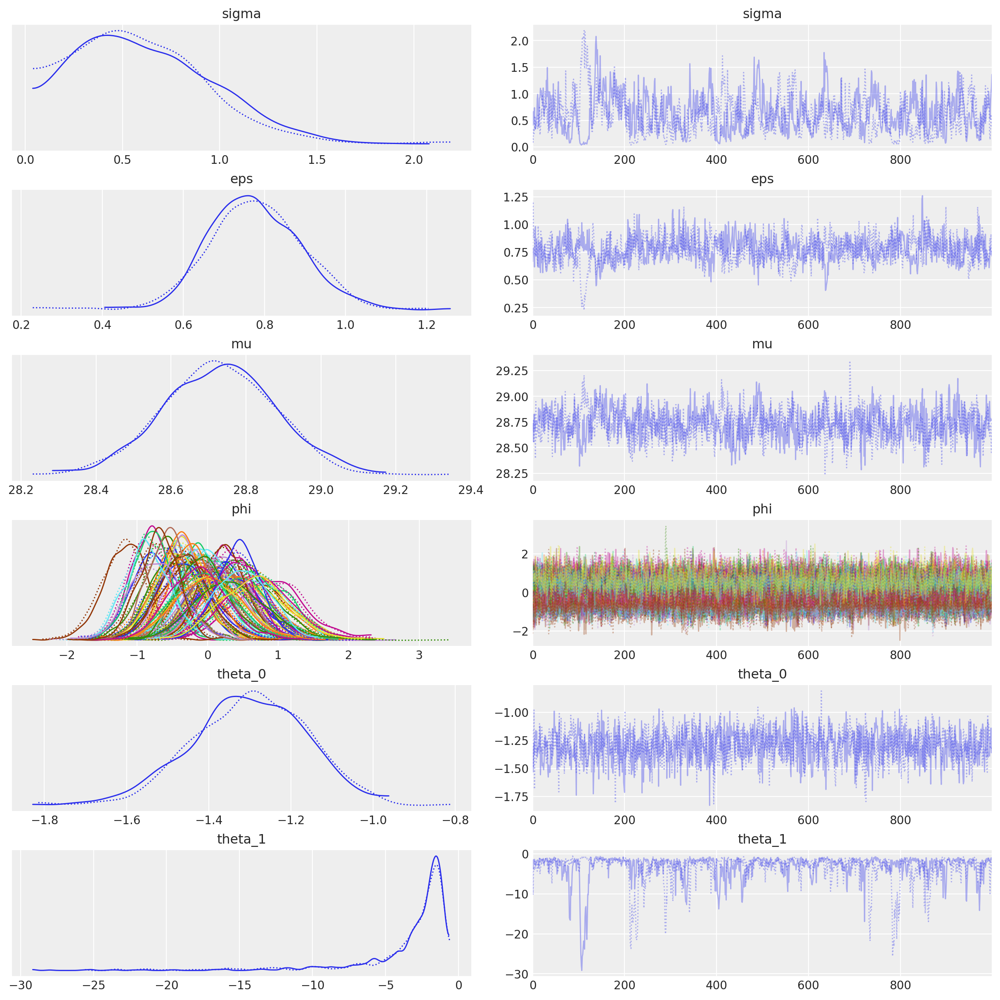

In [126]:
az.plot_trace(trace_2, var_names=['sigma', 'eps', 'mu', 'phi', 'theta_0', 'theta_1'])

<Axes: >

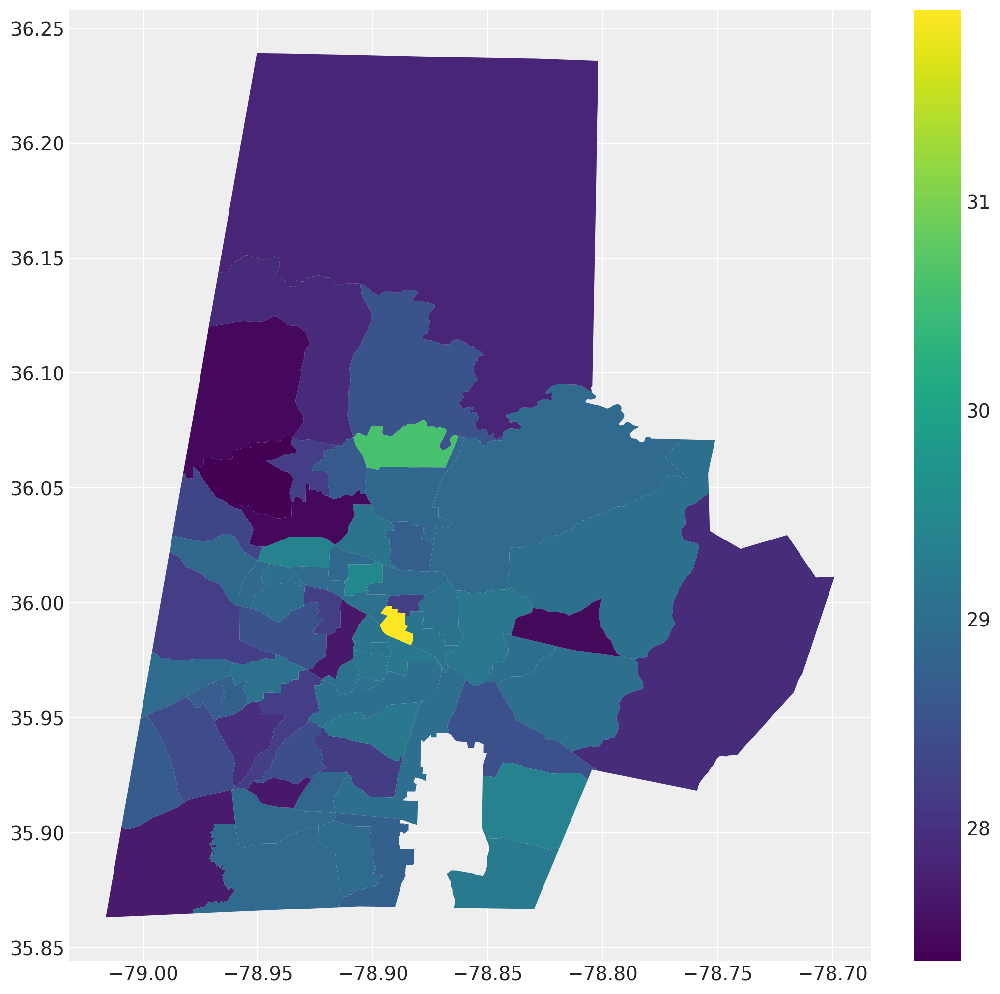

In [273]:
count_data['m2_temp'] = trace_2.posterior['temp'].mean(axis=(0,1)).values
count_data.plot(column='m2_temp', legend=True, figsize=(10,10))

When we adjust for preferential sampling, we simply see that the temperature is predicted to be warmer in all of the census tracts where there are no observations.

In [175]:
print(trace_1.posterior['mu'].mean().values)
print(trace_2.posterior['mu'].mean().values)

28.606414139067066
28.72895584625186


# Model 3
In this model, we look at adjusting temperature based on the income variable, to see if this adjustment provides us with more information.

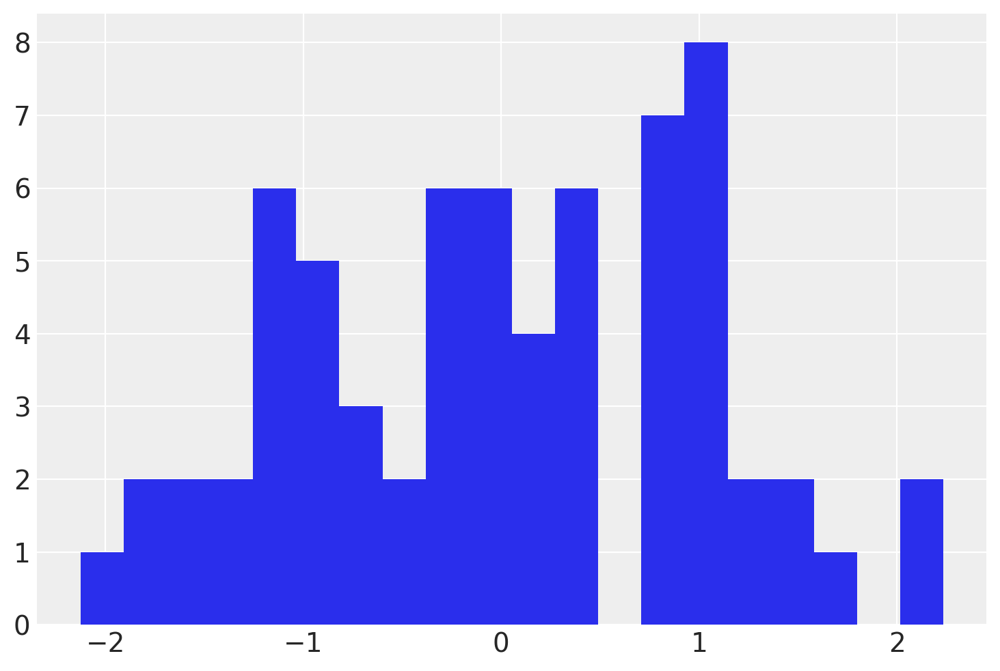

In [274]:
# Let's just normalize income
# mask = count_data['income'].isna()
log_income = np.log(count_data['income'].values)
# Turn this into a masked array with nan values turned to masks
# log_income = np.ma.masked_invalid(log_income)
# log_income = np.log(count_data['income'].values)
log_income_std = (log_income - np.mean(log_income)) / np.std(log_income)
plt.hist(log_income_std, bins=20)
plt.show()

In [134]:
with pm.Model() as m3:
    sigma = pm.Exponential('sigma', 1)
    eps = pm.Exponential('eps', 1)
    
    mu = pm.Normal('mu', mu = temp.mean(), sigma = temp.std())
    phi = pm.ICAR('phi', W=adj)

    beta_1 = pm.Normal('beta_1', mu=0, sigma=10)

    # Likelihood
    temp_est = mu + beta_1 * log_income_std + sigma*phi
    T = pm.Normal('temp', temp_est, sigma = eps, observed=temp)

    # Sample
    trace_3 = pm.sample(1000, tune=1000, chains=2, cores=2)#, target_accept=0.6)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, beta_1, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 33 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [135]:
az.summary(trace_3, var_names=['sigma', 'eps', 'mu', 'beta_1'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.426,0.332,0.000,1.032,0.026,0.019,187.0,200.0,1.01
eps,0.779,0.125,0.548,1.009,0.010,0.007,196.0,184.0,1.01
mu,28.725,0.141,28.459,28.983,0.005,0.004,780.0,1224.0,1.01
beta_1,-0.313,0.146,-0.598,-0.057,0.005,0.004,765.0,1148.0,1.00


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'beta_1'}>,
        <Axes: title={'center': 'beta_1'}>]], dtype=object)

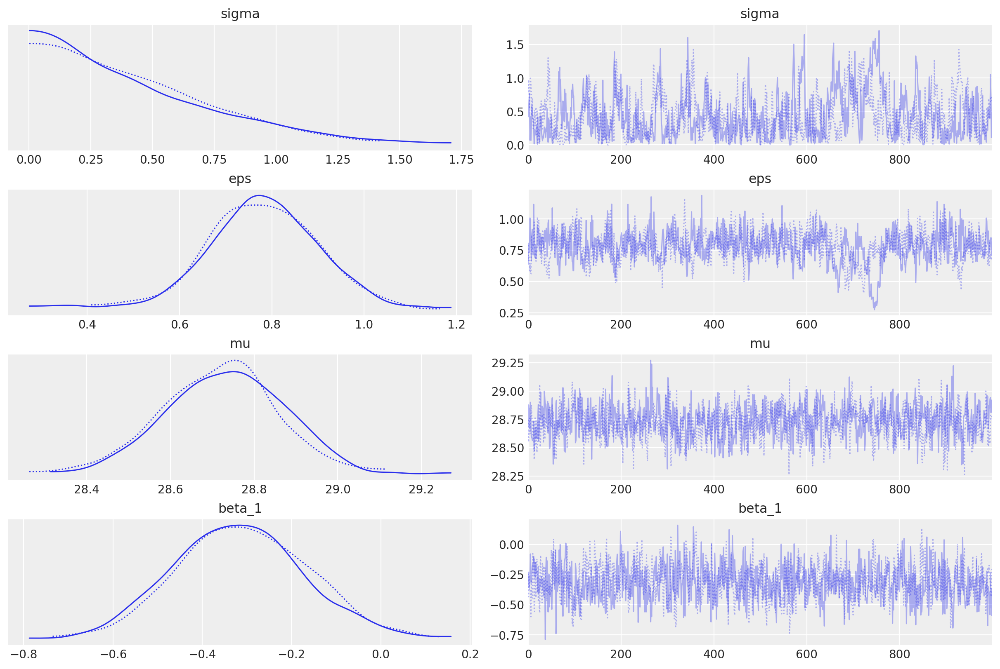

In [136]:
az.plot_trace(trace_3, var_names=['sigma', 'eps', 'mu', 'beta_1'])

<Axes: >

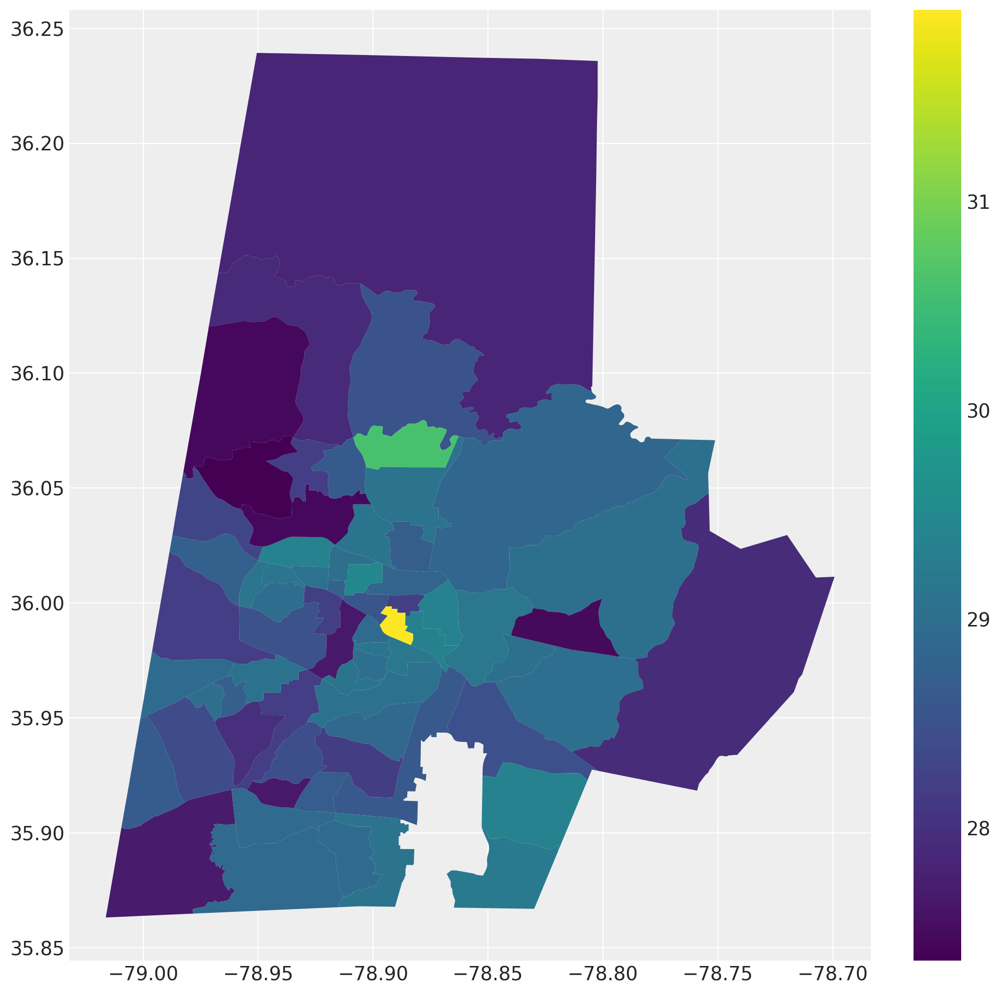

In [275]:
count_data['m3_temp'] = trace_3.posterior['temp'].mean(axis=(0,1)).values
count_data.plot(column='m3_temp', legend=True, figsize=(10,10))

With this model, we predict it is warmer based on income, without adjusting for preferential sampling. This provides us with a perhaps more reasonable map to look at.

# Model 4
Looking at the effect of income on temperature, and determining whether we still see a preferentially sampled relationship between temperature and number of stations

In [181]:
with pm.Model() as m4:
    sigma = pm.Exponential('sigma', 1)
    eps = pm.Exponential('eps', 1)
    mu = pm.Normal('mu', mu = temp.mean(), sigma = temp.std())
    phi = pm.ICAR('phi', W=adj, sigma=sigma)

    theta_0 = pm.Normal('theta_0', mu = 0, sigma = 10)
    theta_1 = pm.Normal('theta_1', mu = 0, sigma = 10)
    theta_2 = pm.Normal('theta_2', mu = 0, sigma = 10)
    
    beta_1 = pm.Normal('beta_1', mu=0, sigma=10)

    # Likelihood
    phi_spat = sigma*phi
    T = pm.Normal('temp', mu + beta_1*log_income_std + phi_spat, sigma = eps, observed=temp)

    intensity = pm.math.exp(theta_0 + theta_1*phi_spat + theta_2*log_income_std)
    rates = intensity * population
    lam = pm.Poisson('lam', mu = rates, observed=counts)

    # Sample
    trace_4 = pm.sample(1000, tune=1000, chains=2, cores=2, target_accept=0.9)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, theta_0, theta_1, theta_2, beta_1, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 87 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [182]:
az.summary(trace_4, var_names=['sigma', 'eps', 'mu', 'beta_1', 'theta_0', 'theta_1', 'theta_2'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,2.216,0.334,1.649,2.842,0.019,0.013,315.0,846.0,1.01
eps,0.247,0.184,0.038,0.603,0.042,0.030,20.0,96.0,1.06
mu,29.464,0.390,28.697,30.183,0.026,0.019,204.0,249.0,1.02
beta_1,-0.714,0.480,-1.761,0.045,0.028,0.020,295.0,516.0,1.01
theta_0,-1.530,0.201,-1.871,-1.158,0.009,0.006,497.0,848.0,1.00
theta_1,-0.390,0.133,-0.628,-0.143,0.005,0.004,604.0,627.0,1.00
theta_2,0.873,0.216,0.504,1.314,0.010,0.007,435.0,602.0,1.00


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'beta_1'}>,
        <Axes: title={'center': 'beta_1'}>],
       [<Axes: title={'center': 'theta_0'}>,
        <Axes: title={'center': 'theta_0'}>],
       [<Axes: title={'center': 'theta_1'}>,
        <Axes: title={'center': 'theta_1'}>],
       [<Axes: title={'center': 'theta_2'}>,
        <Axes: title={'center': 'theta_2'}>]], dtype=object)

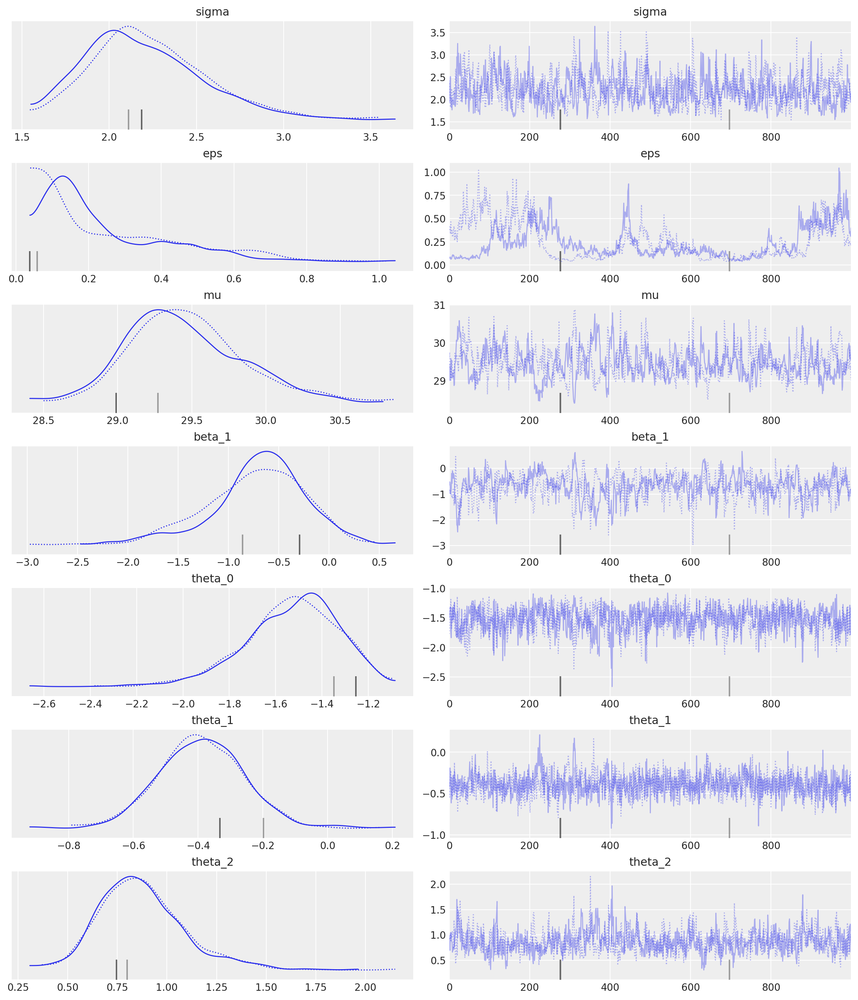

In [183]:
az.plot_trace(trace_4, var_names=['sigma', 'eps', 'mu', 'beta_1', 'theta_0', 'theta_1', 'theta_2'])

<Axes: >

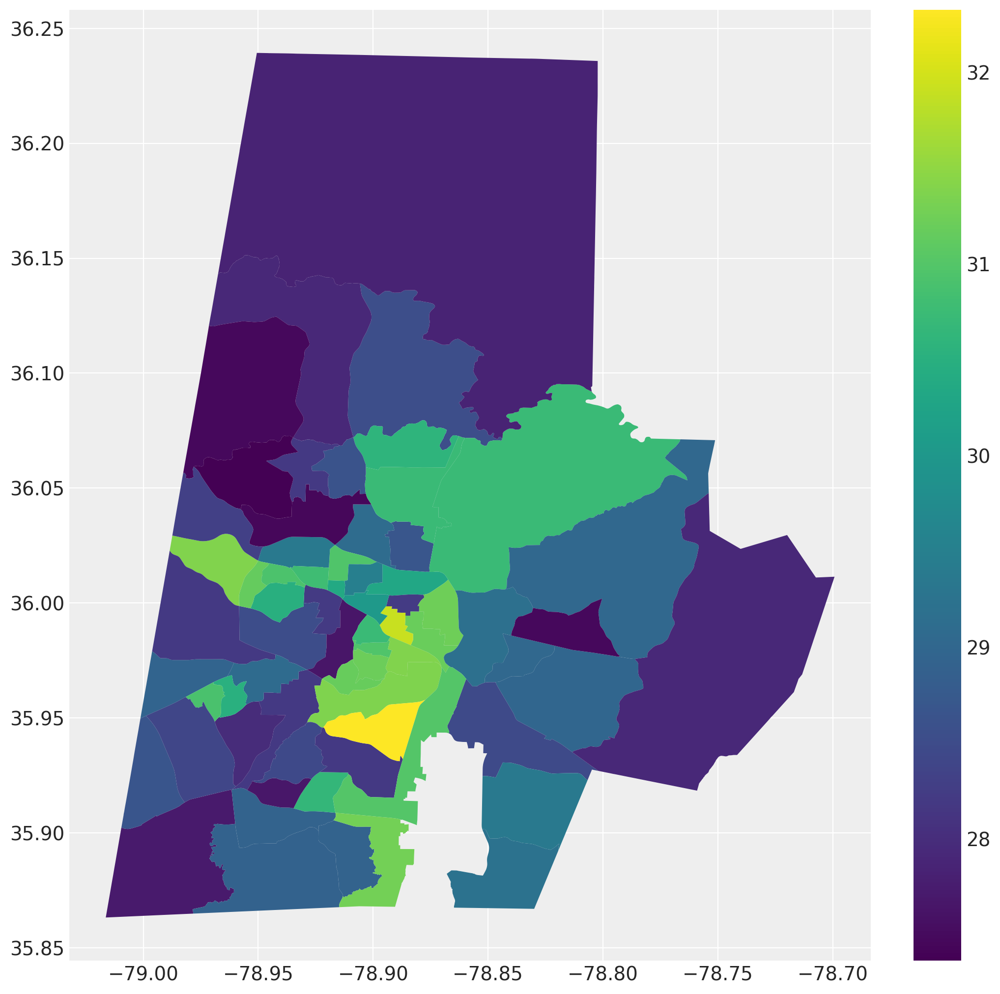

In [276]:
count_data['m4_temp'] = trace_4.posterior['temp'].mean(axis=(0,1)).values
count_data.plot(column='m4_temp', legend=True, figsize=(10,10))

Text(0.5, 1.0, 'Model 4')

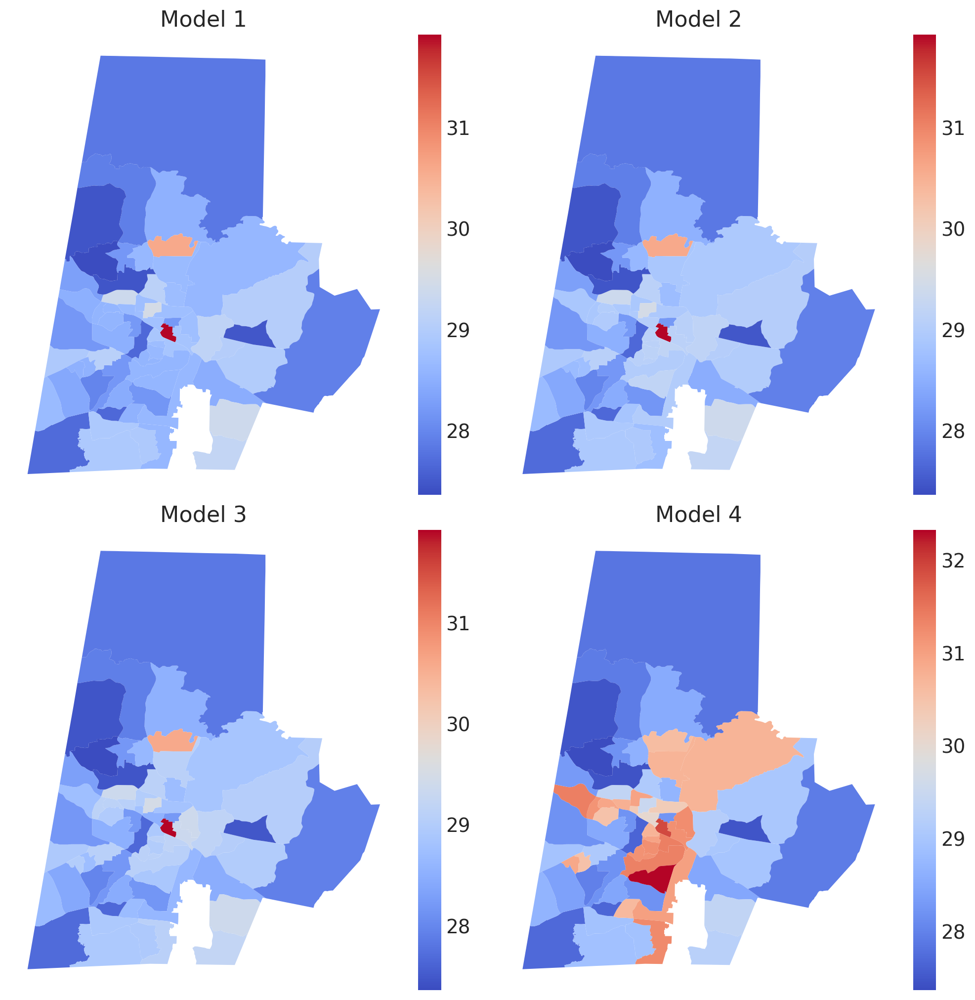

In [277]:
fig, [(ax1, ax2), (ax3, ax4)] = plt.subplots(2,2, figsize=(10,10))
# plt.subplot(2,1,1)
count_data.plot(column='m1_temp', ax=ax1, legend=True, cmap='coolwarm')
ax1.axis('off')
count_data.plot(column='m2_temp', ax=ax2, legend=True, cmap='coolwarm')
ax2.axis('off')
count_data.plot(column='m3_temp', ax=ax3, legend=True, cmap='coolwarm')
ax3.axis('off')
count_data.plot(column='m4_temp', ax=ax4, legend=True, cmap='coolwarm')
ax4.axis('off')

ax1.set_title('Model 1')
ax2.set_title('Model 2')
ax3.set_title('Model 3')
ax4.set_title('Model 4')

In [278]:
count_data[['m1_temp', 'm2_temp', 'm3_temp', 'm4_temp']].mean(axis=0)

m1_temp    28.611100
m2_temp    28.727145
m3_temp    28.726905
m4_temp    29.465538
dtype: float64

# Model 5
Final model -- look at explaining intensity, without using income to explain temperature.

In [203]:
with pm.Model() as m5:
    sigma = pm.Exponential('sigma', 1)
    eps = pm.Exponential('eps', 1)
    mu = pm.Normal('mu', mu = temp.mean(), sigma = temp.std())
    phi = pm.ICAR('phi', W=adj, sigma=sigma)

    theta_0 = pm.Normal('theta_0', mu = 0, sigma = 10)
    theta_1 = pm.Normal('theta_1', mu = 0, sigma = 10)
    theta_2 = pm.Normal('theta_2', mu = 0, sigma = 10)

    # Likelihood
    phi_spat = sigma*phi
    T = pm.Normal('temp', mu + phi_spat, sigma = eps, observed=temp)

    intensity = pm.math.exp(theta_0 + theta_1*phi_spat + theta_2*log_income_std)
    rates = intensity * population
    lam = pm.Poisson('lam', mu = rates, observed=counts)

    # Sample
    trace_5 = pm.sample(1000, tune=1000, chains=2, cores=2, target_accept=0.95)

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/pymc/model/core.py:1323: ImputationWarning: Data in temp contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, eps, mu, phi, theta_0, theta_1, theta_2, temp_unobserved]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 88 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [204]:
az.summary(trace_5, var_names=['sigma', 'eps', 'mu', 'theta_0', 'theta_1', 'theta_2'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,2.163,0.315,1.658,2.784,0.020,0.014,260.0,541.0,1.01
eps,0.332,0.225,0.033,0.754,0.068,0.050,9.0,21.0,1.20
mu,29.174,0.368,28.609,29.971,0.034,0.024,117.0,200.0,1.01
theta_0,-1.449,0.180,-1.801,-1.147,0.009,0.007,414.0,838.0,1.00
theta_1,-0.319,0.154,-0.629,-0.043,0.010,0.007,284.0,211.0,1.00
theta_2,0.638,0.121,0.403,0.857,0.004,0.003,842.0,1184.0,1.00


array([[<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'eps'}>, <Axes: title={'center': 'eps'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'theta_0'}>,
        <Axes: title={'center': 'theta_0'}>],
       [<Axes: title={'center': 'theta_1'}>,
        <Axes: title={'center': 'theta_1'}>],
       [<Axes: title={'center': 'theta_2'}>,
        <Axes: title={'center': 'theta_2'}>]], dtype=object)

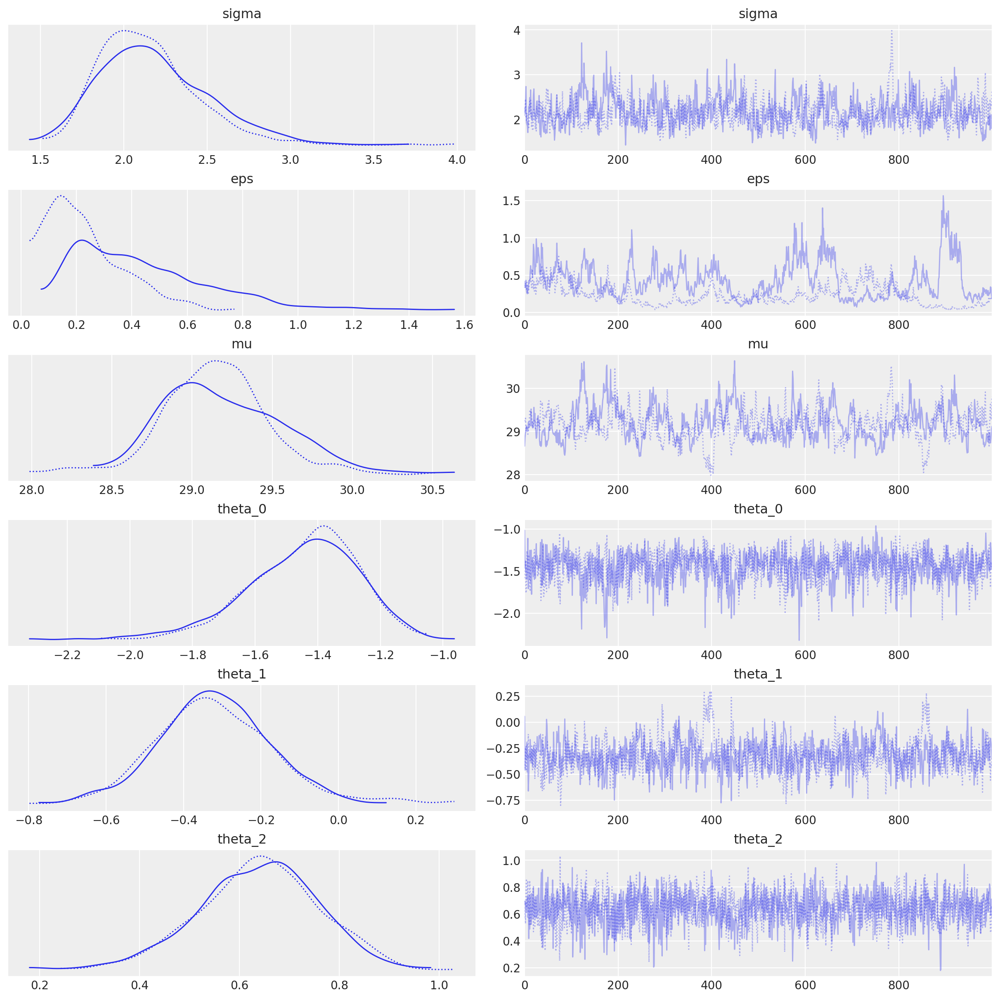

In [205]:
az.plot_trace(trace_5, var_names=['sigma', 'eps', 'mu', 'theta_0', 'theta_1', 'theta_2'])

<Axes: >

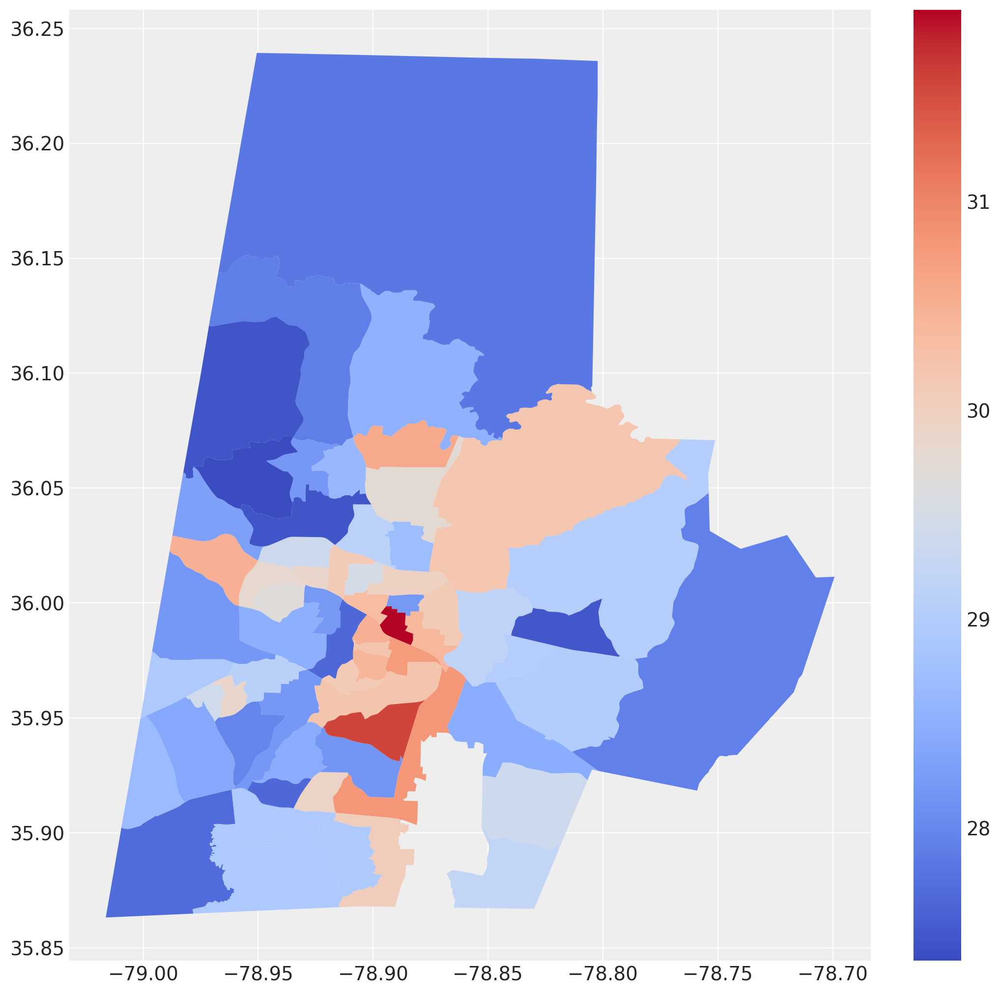

In [279]:
count_data['m5_temp'] = trace_5.posterior['temp'].mean(axis=(0,1)).values
count_data.plot(column='m5_temp', legend=True, figsize=(10,10), cmap='coolwarm')

This final model demonstrates that if we correct for intensity by trying to predict intensity based on income, the model will then adjust for temperature much more severely where the sampling bias still exists.

# Model comparison with traversal data

In [280]:
trav = gpd.read_file('../data/raw/temperature/traversal/pm_trav.shp')

# Only keep Durham
trav = trav[trav.geometry.x < -78.8]

tract_traversal = gpd.sjoin(count_data, trav, op='contains')

tract_avg = pd.pivot_table(tract_traversal, index='geoid', values='temp_f', aggfunc='mean')

tract_avg.head()

/Users/zdc6/mambaforge/envs/pspws/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3493: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_79818/2682223057.py:6: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: GEOGCS["unknown",DATUM["WGS_1984",SPHEROID["WGS 84 ...

  tract_traversal = gpd.sjoin(count_data, trav, op='contains')


,temp_f
geoid,
37063000101,78.709675
37063000102,78.593295
37063000200,80.489893
37063000301,81.086988
37063000302,80.334883


In [281]:
# Reset the index
tract_avg = tract_avg.reset_index()

# Convert temp_f to celsius
tract_avg['trav_temp_c'] = (tract_avg['temp_f'] - 32) * 5/9

# Merge count data with tract_avg
count_data_w_trav = count_data.merge(tract_avg, how='outer', left_on='geoid', right_on='geoid')

In [283]:
print(len(count_data_w_trav))

67


In [285]:
count_data_w_trav[['m1_temp', 'm2_temp', 'm3_temp', 'm4_temp', 'm5_temp', 'trav_temp_c']].corr()

,m1_temp,m2_temp,m3_temp,m4_temp,m5_temp,trav_temp_c
m1_temp,1.000000,0.972140,0.961082,0.538463,0.680908,0.207788
m2_temp,0.972140,1.000000,0.982559,0.709477,0.824314,0.311777
m3_temp,0.961082,0.982559,1.000000,0.709435,0.789261,0.266133
m4_temp,0.538463,0.709477,0.709435,1.000000,0.962489,0.482740
m5_temp,0.680908,0.824314,0.789261,0.962489,1.000000,0.494842
trav_temp_c,0.207788,0.311777,0.266133,0.482740,0.494842,1.000000


So, we see the highest correlation between model 5 and the temperature traversal data. This is SUPER interesting, and it demonstrates that we do in fact correct for the bias much better when we apply preferential sampling.

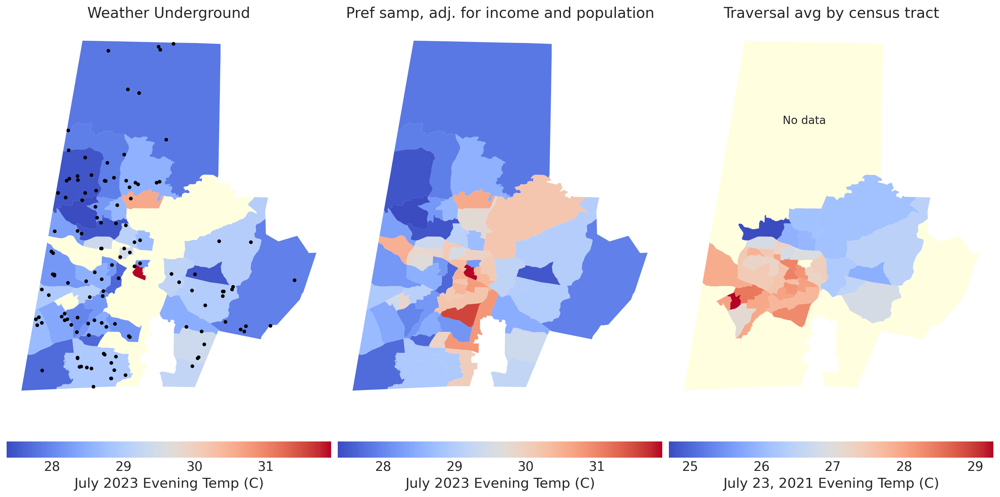

In [318]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15,10))
# plt.subplot(2,1,1)
count_data_w_trav.plot(column='eve_avg', ax=ax1, cmap='coolwarm', missing_kwds={'color': 'lightyellow'}, legend=True, legend_kwds={'label': "July 2023 Evening Temp (C)", "orientation": "horizontal"})
ax1.axis('off')
ax1.set_title("Weather Underground")
ax1.plot(wu_data['longitude'], wu_data['latitude'], 'k.')#, label='stations')

count_data_w_trav.plot(column='m5_temp', ax=ax2, cmap='coolwarm', legend=True, legend_kwds={'label': "July 2023 Evening Temp (C)", "orientation": "horizontal"})
ax2.axis('off')
ax2.set_title("Pref samp, adj. for income and population")

# Plot traversal temperature
count_data_w_trav.plot(column='trav_temp_c', ax=ax3, cmap='coolwarm', missing_kwds={'color': 'lightyellow'},legend=True, legend_kwds={'label': "July 23, 2021 Evening Temp (C)", "orientation": "horizontal"})
ax3.axis('off')
ax3.set_title("Traversal avg by census tract")
# Add a comment on ax2 saying no data
ax3.text(-78.91, 36.15, "No data", fontsize=12)

# Save this figure
plt.savefig('../results/by_census_tract/with_pref_sampled.png', dpi=300, bbox_inches='tight')
plt.show()

In [317]:
# Save the dataframe
count_data_w_trav.to_file('../results/by_census_tract/model_results_2024_01_23.shp')

/var/folders/3r/mm1k6hx10zlgnb46j7vtvxz80000gq/T/ipykernel_79818/3723450506.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  count_data_w_trav.to_file('../results/by_census_tract/model_results_2024_01_23.shp')
